# What are attribution-based explanations?

Let $f:\mathbb{R}^d\rightarrow\mathbb{R}^c$ be a black-box model that we are aiming to explain. It maps from the $d$-dimensional input space to a $c$-dimensional output space. 

Attribution-based methods explain the prediction target $t$ by assigning an **attribution value** to the input features, resulting in an attribution map (a.k.a. saliency map, heatmap, etc.)

The **target** $t$ is a scalar. This is constrained by the nature of attribution methods --  one can only attribute the prediction of a scalar to the model's input. It is currently infeasible and ill-posed to seek "the attribution of the input features regarding an output vector".

As a result, for mutli-class problem, there are many different ways to define the target $t$:

- Predicted Logit of the target class $t = f_y(\mathbf{x})$
- Predicted likelihodd of the target class $t = \sigma_y(f(\mathbf{x}))$
- Loss term of any kind: $t = L(f(\mathbf{x}), y)$, where $L$ is a loss term such as MSE loss, NLL, etc.

Given such a target, the attribution-based explanation is defined as $\phi_f:\mathbf{R}^d\rightarrow\mathbf{R}^d$, which maps each feature to its corresponding attribution value.

## Linear Models -- A Starting Point for Attributions

In the extreme scenario, the "black-box" model degenerates to a linear model $f(\mathbf{x})=W^T\mathbf{x}+\mathbf{b}$ where $W\in\mathbb{R}^{d\times c}, \mathbf{b}\in\mathbb{R}^c$ are the trainable weights of the model. Then the prediction $f_y(\mathbf{x})$ can be written as
$$f_y(\mathbf{x})=\mathbf{w}_y^T\mathbf{x}_y+b_y$$.

## Main Two Types: Sensitivity vs. Contributions

There are basically two types attribution based methods, namely, the **sensitivity**-based and the **contribution**-based explanations. Due to the variety of the definitions, they are also referred as **local** and **global** explanations sometimes. *Note that "global explanations" can also have multiple meanings in XAI depending on the context."*.

- **Sensitivity** attribution scores describe how the change of the features would affect the target value.
- **Contribution** attribution scores describe how the feature "contribute" to the target value.

For linear models, we have

- **Sensitivity**: $\phi_f(\mathbf{x}) = \mathbf{w}$
- **Contribution**: $\phi_f(\mathbf{x}) = \mathbf{w}\odot\mathbf{x}$

### **Almost all attribution-based explanation methods degenerate to these two in linear scenarios.**

- Ref: [TOWARDS BETTER UNDERSTANDING OF
GRADIENT-BASED ATTRIBUTION METHODS
FOR DEEP NEURAL NETWORKS](https://arxiv.org/pdf/1711.06104)

# Input Gradient

- Ref: [Deep Inside Convolutional Networks: Visualising
Image Classification Models and Saliency Maps](https://arxiv.org/pdf/1312.6034)

##  --- a.k.a. Gradient, Saliency map, etc.

The explanation is defined as $$\phi_f(\mathbf{x}) = \nabla_\mathbf{x} t,$$ where $t$ can be $f_y(\mathbf{x})$, $\sigma_y(f(\mathbf{x}))$, $L(f(\mathbf{x}),y)$, etc.

Input gradient attribution values describe **the local sensitivity of the model regarding the neighborhood of the input sample**.

In [1]:
import torch
import numpy as np
from torchvision import models
from data_utils import *
from utils import *


### Set the paths for data
val_path = '../../ssd/data/ILSVRC2012/ILSVRC2012_img_val'
label_path = '../../ssd/data/ILSVRC2012/val.txt'
class_path = '../data/ILSVRC_classes.txt'

### Load the data
valset = ILSVRC2012_val(val_path, label_path, class_path)

device = torch.device("cuda:1")

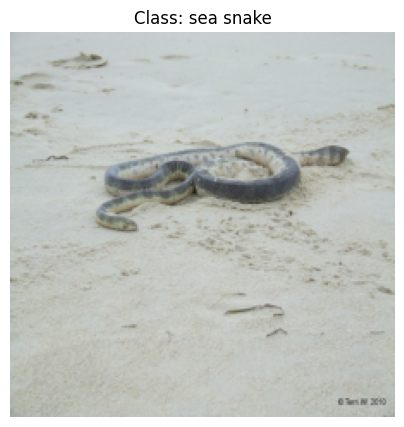

In [2]:
input_id = 0

plot_image_id(input_id, valset)

In [3]:
model = models.resnet18(pretrained = True).to(device)
model.eval()

/home/yipei/anaconda3/envs/pytorch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yipei/anaconda3/envs/pytorch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [4]:
image, label = valset[0]
image = image[None]

In [5]:
model.zero_grad()
image.requires_grad = True
pred = model(image.to(device))

grad = abs(torch.autograd.grad(
    inputs = image,
    outputs = pred[0,label],
)[0].detach().clone().cpu())

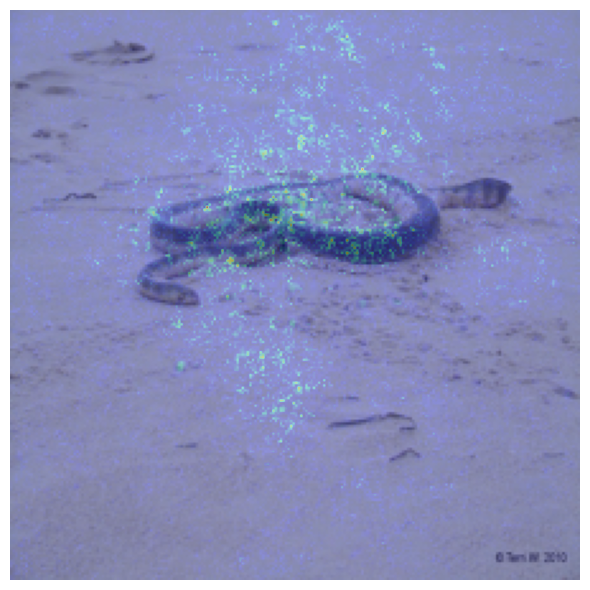

In [6]:
plot_image_attr(image, grad, overlap = True)

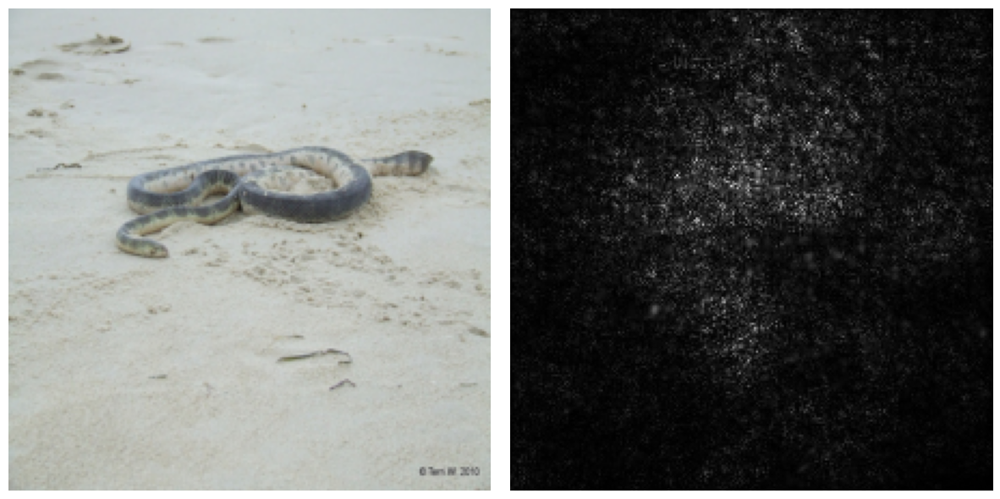

In [7]:
plot_image_attr(image, grad, overlap = False)

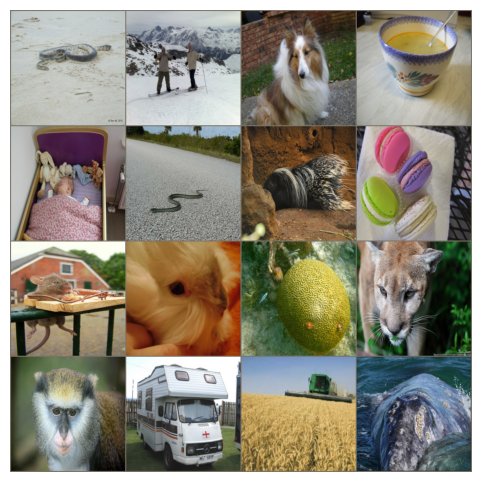

In [8]:
## get the batches of images and labels:
# images: bs x 3 x image_size x image_size
# labels: bs x 1
images, labels = get_batch_data(valset)

plot_batch_image(images)

In [9]:
## Step-by-Step Implementations of Gradient
# The wrapped-up version is available in .attributions

model.zero_grad()
images.requires_grad = True

pred = model(images.to(device))
target = pred[range(len(labels)), labels].sum()

grad = abs(torch.autograd.grad(
    inputs = images,
    outputs = target,
)[0].detach().cpu())

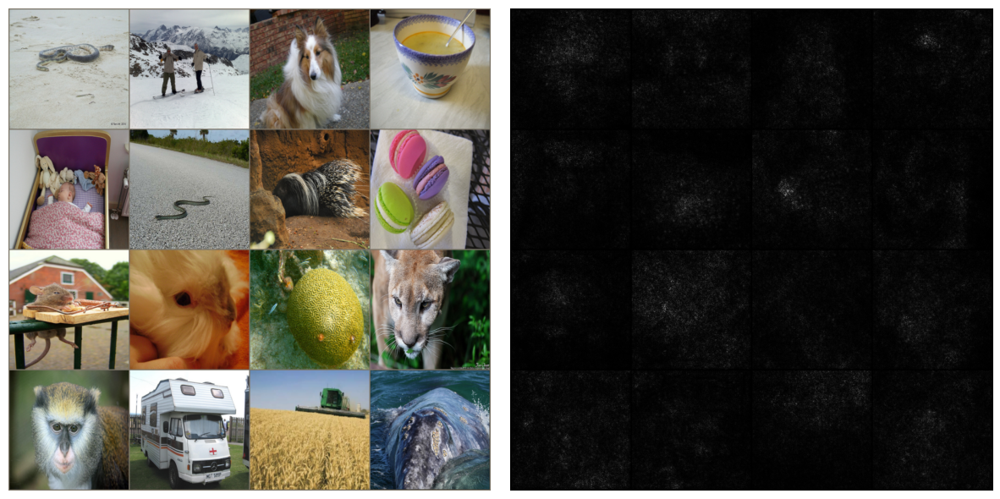

In [10]:
plot_batch_image_attr(images, grad)

## [`captum`](https://captum.ai/api/saliency.html): An Attribution-Based Methods Package 

In [11]:
# !pip install captum

In [12]:
# import the input gradient implementation from captum
from captum.attr import Saliency

# instantiate the method for the model
captum_implementation = Saliency(model)

# obtain the attribution
attribution = captum_implementation.attribute(
    images.to(device), target = labels.to(device)).detach().cpu()

/home/yipei/anaconda3/envs/pytorch/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
## Inspect if the results from captum are consistent

print(torch.isclose(grad, attribution, atol = 1e-6, rtol = 1e-4).all())

tensor(False)


# Input $\times$ Gradient

Ref: [
Not Just a Black Box: Learning Important Features Through Propagating Activation Differences](https://arxiv.org/abs/1605.01713)

The input gradient captures the **sensitivity** attribution scores describe how the change of the features would affect the target value. For a linear prediction 
$$\hat{y} = \mathbf{w}^T\mathbf{x}+b,$$
the contribution of each feature can be understood as $\mathbf{w}\odot\mathbf{x}$. That is, the contribution of the $i$-th feature to the prediction is natually $w_ix_i$ as they **sum up to the prediction.** (a.k.a. completeness)

As a result, one natural generalization of the explanation $\mathbf{w}\odot\mathbf{x}$ to non-linear scenario is simply
$$\big(\nabla_\mathbf{x} f(\mathbf{x})\big)\odot\mathbf{x},$$
which is known as Input x Gradient (IxG)

In [14]:
# Step-by-Step Implementation

model.zero_grad()
images.requires_grad = True

pred = model(images.to(device))
target = pred[range(len(labels)), labels].sum()

grad = torch.autograd.grad(
    inputs = images,
    outputs = target,
)[0].detach().clone()

ixg = (images*grad).detach().clone().cpu()

In [15]:
from attributions import input_x_gradient

ixg = input_x_gradient(model, images.to(device), labels.to(device)).detach().cpu()

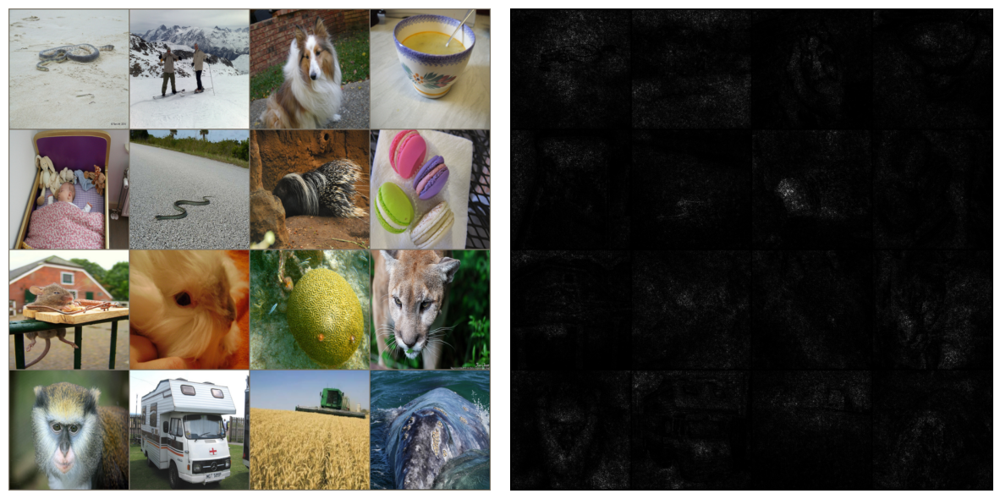

In [16]:
plot_batch_image_attr(images, ixg)

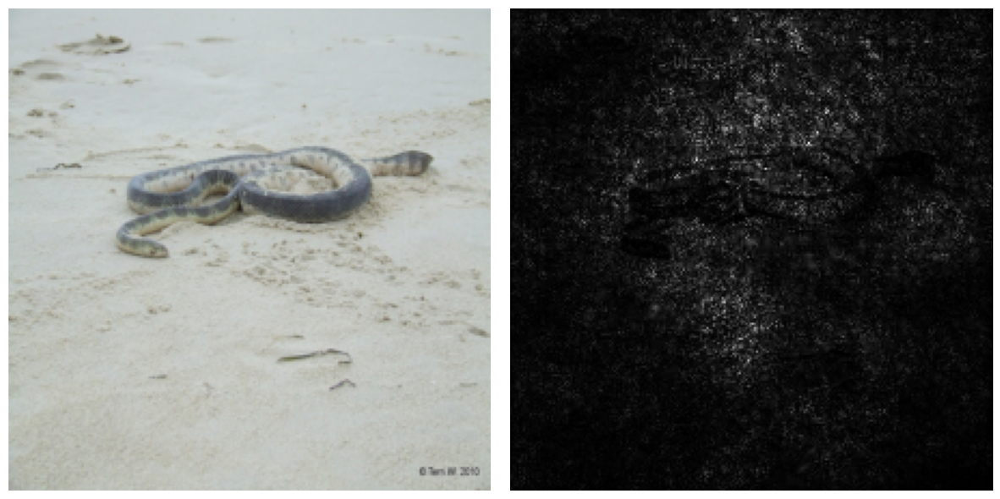

In [17]:
plot_image_attr(images[:1], ixg[:1])

In [18]:
## captum implementations
# import the input gradient implementation from captum
from captum.attr import InputXGradient

# instantiate the method for the model
captum_implementation = InputXGradient(model)

# obtain the attribution
attribution = captum_implementation.attribute(
    images.to(device), target = labels.to(device)).detach().cpu()

In [19]:
## Validate if they correspond

print(torch.isclose(attribution, ixg, atol = 1e-6, rtol = 1e-3).all())

tensor(True)


### Remarks

Although Input x Gradient $\big(\nabla_\mathbf{x} f(\mathbf{x})\big)\odot\mathbf{x}$ degenerates to $\mathbf{w}\odot\mathbf{x}$ when $f$ degenerates to a linear model, it fall shorts of preserving the "sum-up-to-target" property. That is, in general
$$\sum_{i=1}^d\frac{\partial f}{\partial x_i}x_i\ne f(x),$$
where $d$ is the input dimension.

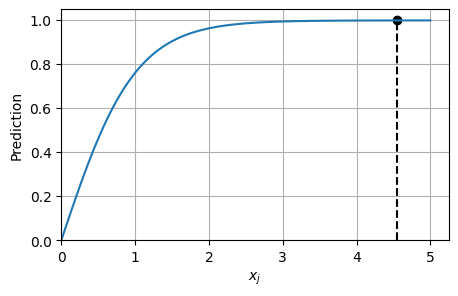

In [20]:
x = np.linspace(0,5,100)
y = np.tanh(x)
plt.figure(figsize = (5,3))
plt.plot(x,y)
plt.plot([x[-10], x[-10]], [0, y[-10]], "k--")
plt.scatter(x[-10], y[-10], color = "k")
plt.ylim(0)
plt.xlim(0)
plt.ylabel("Prediction")
plt.xlabel(r"$x_j$")
plt.grid()
plt.show()

## Integrated Gradients (IG)

Ref: [Axiomatic Attribution for Deep Networks](https://arxiv.org/abs/1703.01365)

In order to overcome this issue, integrated gradient is proposed as the attributions of the line integral from the output at a reference $\mathbf{r}$ to the input $\mathbf{x}$. Note that the line integral from $\mathbf{r}$ to $\mathbf{x}$ is exactly $f(\mathbf{x}) - f(\mathbf{r})$, which is irrelevant to the path $C$. However, the attribution **is affected by the choice of $C$**. IG takes the straight line from $\mathbf{r}$ to $\mathbf{x}$ as $C:\mathbf{r} + (\mathbf{x} - \mathbf{r})\alpha, \alpha\in[0,1]$. 

According to [Gradien Theorem](https://en.wikipedia.org/wiki/Gradient_theorem), this line integral can be written as
$$f(\mathbf{x}) - f(\mathbf{r}) = \int_C \nabla f(\mathbf{t})\cdot\textrm{d}\mathbf{t} = \int_0^1 \nabla f(\mathbf{t}(\alpha))\cdot\mathbf{t}'(\alpha)\textrm{d}\alpha.$$

Since $\mathbf{t}'(\alpha) = \mathbf{x} - \mathbf{r}$, this can be approximated by
$$f(\mathbf{x}) - f(\mathbf{r})\approx \sum_{m=1}^M\Big(\sum_{i=1}^d\big(\frac{\partial f(\mathbf{r} + \frac{m}{M}(\mathbf{x}-\mathbf{r}))}{\partial x_i}\frac{x_i - r_i}{M}\big)\Big),$$
where $M$ is the number of histograms in estimating the integral.

### Reference

The reference $\mathbf{r}$ is used to represent the "null" input that imputes the "deleted" features. This is important because most DNNs take the inputs of a fixed size. Popular choices are zeros, means, channel means, random noise, etc. The optimal choice remains an open question. An interesting visualization can be found [here](https://distill.pub/2020/attribution-baselines/?utm_source=researcher_app&utm_medium=referral&utm_campaign=RESR_MRKT_Researcher_inbound).

In [21]:
## Step-by-Step Implementation
from tqdm import tqdm

M = 50
model = model.to(device)
model.zero_grad()
reference = torch.zeros_like(images)

ig = torch.zeros_like(images)
for m in tqdm(range(1,M+1)):
    model.zero_grad()
    line = (reference.detach().clone() + (images.detach().clone() - reference.detach().clone()) * m/M).requires_grad_(True)
    
    pred = model(line.to(device))
    target = pred[range(len(labels)), labels].sum()

    grad = torch.autograd.grad(
        inputs = line,
        outputs = target,
    )[0].detach()
    
    ig += grad/M
    
ig = ig*(images - reference)
ig = ig.detach().clone()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 34.60it/s]


In [22]:
from attributions import integrated_gradients

ig = integrated_gradients(model, images.to(device), labels.to(device)).detach().cpu()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 51.21it/s]


In [23]:
ig.sum([1,2,3])

tensor([15.3871, 19.7112, 16.1245, 11.6904,  8.1452, 13.4004, 17.0486, 11.7251,
         6.1822, 10.1542, 22.5916, 21.6086, 24.9607, 24.0254, 19.4030, 25.6125])

In [24]:
## Captum Implementation

from captum.attr import IntegratedGradients

# captum_implementation = IntegratedGradients(model)
# attribution = captum_implementation.attribute(images.to(device), target=labels.to(device)).detach().cpu()

captum_implementation = IntegratedGradients(model.cpu())
attribution = captum_implementation.attribute(images, target=labels).detach().cpu()

# put the model back to device
model = model.to(device)

In [25]:
## Prediction difference between sample x and zero reference
with torch.no_grad():
    diff = model(images.to(device)).detach().cpu()[range(len(labels)), labels] -\
    model(reference.to(device)).detach().cpu()[range(len(labels)), labels]

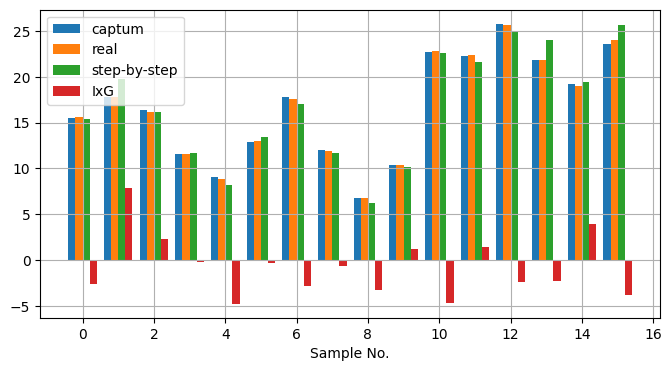

In [26]:
## Compare the differences:

plt.figure(figsize = (8,4))
plt.bar(np.arange(len(labels)) - 0.3, attribution.sum([1,2,3]), width = 0.2, label = "captum")
plt.bar(np.arange(len(labels)) - 0.1, diff, width = 0.2, label = "real")
plt.bar(np.arange(len(labels)) + 0.1, ig.sum([1,2,3]), width = 0.2, label = "step-by-step")
plt.bar(np.arange(len(labels)) + 0.3, ixg.sum([1,2,3]), width = 0.2, label = "IxG")

plt.xlabel("Sample No.")
plt.legend()
plt.grid()
plt.show()

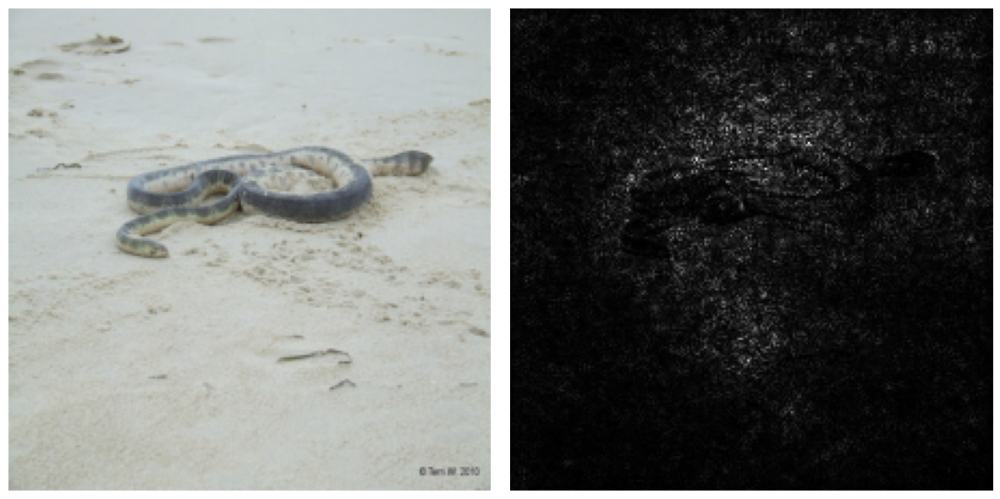

In [27]:
plot_image_attr(images[:1], ig[:1])

### Remarks

- When $f$ is linear, IG degenerates to $\mathbf{w}\odot(\mathbf{x} - \mathbf{r})$

- Different paths other than the staightline can also have the **completeness** property. The authors pick the straight line as it's the simplest version and is also symmetric. However, there are discussions regarding other paths.

- Integrated gradient is not as efficient as IxG or gradient, because due to the nonlinearity of DNNs, a large $M$ is usually required. 

- It is worth noticing that although IG and IxG are very distinguished, their heatmaps look alike.

## SHapley Adaptive exPlanations (SHAP)

Ref: [A Unified Approach to Interpreting Model
Predictions](https://proceedings.neurips.cc/paper_files/paper/2017/file/8a20a8621978632d76c43dfd28b67767-Paper.pdf)

Integrated Gradient requires to compute the gradient of $f$ at $\mathbf{t}$ as $\nabla f(\mathbf{t})$, where $\mathbf{t}$ is a convex combination between the input $\mathbf{x}$. This give rise to some issues, such as the requirement for the full access to the model. Besides, the meaning of $\mathbf{t}$ is questionable (e.g. an image where all pixel values are multiplied by the ratio $\alpha$).


### Understanding SHAP with an example
Let $d = 3$ for an example, the IG takes the path as:
$$(0,0,0)\rightarrow(x_1/M, x_2/M, x_3/M)\rightarrow 2\cdot (x_1/M, x_2/M, x_3/M)\rightarrow\cdots\rightarrow M\cdot (x_1/M, x_2/M, x_3/M)$$

One other way to formulate the path is to do it feature by feature:
$$(0,0,0)\rightarrow(x_1,0,0)\rightarrow(x_1,x_2,0)\rightarrow(x_1,x_2,x_3)$$

Note that there is no need to further split each dimension, as the term $\mathbf{t}'(\alpha)$ degenerates to $\mathbf{e}_i$ for the $i$-th feature.
As a result, the explanation along this path can be written as
$$\phi_f^{(123)}(\mathbf{x}) = (f(x_1,0,0) - f(\mathbf{0}), f(x_1,x_2,0) - f(x_1,0,0), f(\mathbf{x}) - f(x_1,x_2,0))$$

Besides, the completeness property is satisfied by
$$f(x_1,0,0) - f(\mathbf{0}) + f(x_1,x_2,0) - f(x_1,0,0) + f(\mathbf{x}) - f(x_1,x_2,0) = f(\mathbf{x}) - f(\mathbf{0})$$


### The many paths along dimensions

Note that the previous example is valid only for the path $x_1\rightarrow x_2\rightarrow x_3$. If the path becomes $x_2\rightarrow x_1\rightarrow x_3$, then the explanation becomes
$$\phi_f^{(213)}(\mathbf{x}) = (f(0,x_2,0) - f(\mathbf{0}), f(x_1,x_2,0) - f(0,x_2,0), f(\mathbf{x}) - f(x_1,x_2,0))$$

There are totally $d!$ possible paths from $\mathbf{r}$ to $\mathbf{x}$. Therefore, **SHAP takes the average over all $n!$ paths** to obtain the final explanation:
$$\phi_f(\mathbf{x}) = \frac{1}{d!}\sum_{\tau\in S_d}\phi_f^\tau(\mathbf{x}),$$
where $S_d$ is the symmetric group of $d$-th order, and $\tau$ is any permuation of $\{1,\cdots,d\}$.

### The definition of SHAP

In the original work, SHAP is defined through raw definition of the Shapley value as
$$\phi_f(\mathbf{x})_i = \sum_{\mathbf{x}'\subseteq \mathbf{x}\backslash i}\frac{|\mathbf{x}'|!(d! - |\mathbf{x}'| - 1)!}{d!}[f(\mathbf{x}') - f(\mathbf{x}'\backslash i)]$$

Here we abuse the notation and use the set symbols for vectors. e.g. $(x_1,x_2,x_3)\backslash 1 = (0,x_2,x_3)$, $(x_1,0,0)\subseteq(x_1,x_2,0)\subseteq(x_1,x_2,x_3)$, etc.

Essentially, SHAP takes the average across all scenarios where the $i$-th feature can be added to the subset $\mathbf{x}'$ of features that do not contain the $i$-th feature. It can be easily proved by Fubini's principle that this definition is equivalent to the path-based derivation demonstrated above. The proof is skipped here.

### Remarks:

- Note that the completeness property is satisfied by any path explanation $\phi^{\tau}_f(\mathbf{x})$, it is also satisfied by their average, SHAP.

- SHAP is **extremely inefficient** as it requires to inference for at least $2^d$ times to compute the precise value ($d\cdot d!$ times if computed directly). This makes it impossible for pixel-wise implementation for image data. Even for a tabular data, it's still infeasible. Usually the simplest way is to sample from all permuations (or subsets if using the raw definition). There are also **many** variants of SHAP, mosth of which aim at reducing the computational burden. They are beyond the scope of this tutorial.

- [`captum`](https://captum.ai) provides a direct implementation of SHAP. It is also worth noticing that the authors also provide an official implementation through [`shap`](https://shap.readthedocs.io/en/latest/). This is a much more detailed implementation that includes many variants.

### The following implementation shows that it's basically impossible to have raw SHAP on image data

This is because $d = 3*224*224 = 1505281$. This basically requires 1505281 times of inference for only **one** path. For a precise computation, it requires $d! = 1505281!$ times of repetitions. This is impossible.

In [28]:
# from captum.attr import ShapleyValueSampling

# captum_inplementation = ShapleyValueSampling(model)
# attr = captum_inplementation.attribute(
#     images.to(device), 
#     target=labels.to(device), 
#     n_samples=10, 
#     show_progress = True)

In [29]:
# ## Step-by-Step SHAP
# ## This is more efficient, but still impossible even for only one path

# samples = sample_permutations(3*224*224,10)
# shap = torch.zeros_like(images)
# path = torch.zeros_like(images).to(device)

# with torch.no_grad():
#     for sample in samples:

#         for idx in tqdm(sample):
            
#             coord = torch.unravel_index(torch.tensor(idx), (3,224,224))
            
#             path_next = path.detach().clone()
#             path_next[:,coord[0],coord[1],coord[2]] = images[:,coord[0],coord[1],coord[2]].clone()
            
#             shap[:,coord[0],coord[1],coord[2]] = (model(path_next) - model(path))[range(len(labels)), labels]

In [30]:
## A toy model for the demonstration of SHAP
mlp = torch.nn.Sequential(
    torch.nn.Linear(10,10),
    torch.nn.ReLU(),
    torch.nn.Linear(10,1)
).to(device)

input = torch.randn(1,10).to(device)

In [31]:
### Step-by-Step Implementation of SHAP

samples = sample_permutations(10,100)
shap = []

with torch.no_grad():
    for sample in samples:
        shap.append(torch.zeros_like(input))
        path = torch.zeros_like(input).to(device)
        for idx in sample:
            
            path_next = path.detach().clone()
            path_next[0,idx-1] = input[0,idx-1]
            
            shap[-1][0,idx-1] += (mlp(path_next) - mlp(path))[0,0]
            path = path_next.detach().clone()
            
shap = torch.cat(shap)

In [32]:
## Inspect if every path satisfies the completeness property
print(torch.isclose(shap.sum(1), (mlp(input)[0,0] - mlp(torch.zeros_like(input))[0,0])).all())

tensor(True, device='cuda:1')


In [33]:
from captum.attr import ShapleyValueSampling

captum_inplementation = ShapleyValueSampling(mlp)
attribution = captum_inplementation.attribute(
    input, 0, 
    n_samples=100)

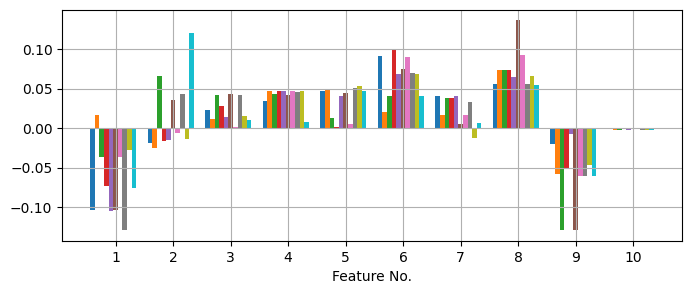

In [34]:
## See the differences in the SHAP attributions along each path (colors)
plt.figure(figsize = (8,3))
for i in range(10):
    plt.bar(np.arange(10) - 0.4 + 0.08*i, shap[i].detach().cpu(), width = 0.08)
plt.grid()
plt.xticks(np.arange(10), [i for i in range(1,11)])
plt.xlabel("Feature No.")
plt.show()

In [35]:
from attributions import integrated_gradients

ig = integrated_gradients(mlp, input, [0])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 755.15it/s]


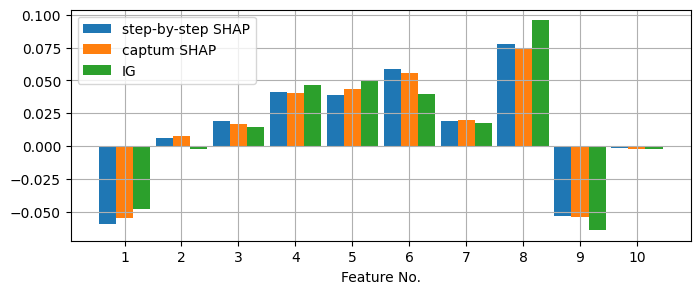

In [36]:
plt.figure(figsize = (8,3))
plt.bar(np.arange(10)-0.3, shap.mean(0).detach().cpu(), width = 0.3, label = "step-by-step SHAP")
plt.bar(np.arange(10), attribution[0,0].detach().cpu(), width = 0.3, label = "captum SHAP")
plt.bar(np.arange(10)+0.3, ig[0].detach().cpu(), width = 0.3, label = "IG")
plt.grid()
plt.legend()
plt.xticks(np.arange(10), [i for i in range(1,11)])
plt.xlabel("Feature No.")
plt.show()

## Grad-CAM

Ref: [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391)

Supose $a_{ij}^k$ to be the output of the CNN backbone, where $0<i,j<\sqrt{d'}$ are the spatial coordinates, and $k$ is the channel. Then for GradCAM, the explanation of target $t = f_y(\mathbf{x})$ is
$$\phi_f(\mathbf{x}) = \sum_k\Big(\frac{1}{d'}\sum_{i,j}\frac{\partial f_y(\mathbf{x})}{\partial a_{ij}^k}\Big)\mathbf{a}^k$$

This can be understood as **a weighted summation of the activations across all channels**. And the weights $\frac{1}{d'}\sum_{i,j}\frac{\partial f_y(\mathbf{x})}{\partial a_{ij}^k}$ are the average of the gradient of the corresponding activation.

### Upsampling

As a representitive of CNN-based attributions, one can observe that the attribution $\phi_f(\mathbf{x})$ is of dimension $d'<d$ instead of the input space dimension. For example, for an input of size $d = 224\times 224$ and a ResNet-18 model, the explanation is of size $7\times 7$ only. This requires the use of upsampling schemes (usually bilinear) to give explanations at the original scale.

The use of upsampling is very common in attribution methods, especially for CNN-based explanations or perturbation-based methods.

In [37]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output#.detach()
    return hook
# handle = model.layer3[1].conv2.register_forward_hook(get_activation('feature'))
handle = model.layer4[1].bn1.register_forward_hook(get_activation('feature'))
target = model(images.to(device))[range(len(labels)), labels].sum()
handle.remove()

grad_for_gradcam = torch.autograd.grad(
    inputs = activation['feature'],
    outputs = target,
    create_graph = True
)[0]

gradcam = (activation['feature'] * grad_for_gradcam.mean(dim = [2,3],keepdims=True)).sum(1).detach().cpu()

upsampler = torch.nn.Upsample(scale_factor = 32, mode = "bilinear")
gradcam = upsampler(gradcam.unsqueeze(1))

In [38]:
from attributions import GradCAM

## The choice of layers is hard coded
gradcam = GradCAM(model, images.to(device), labels.to(device))

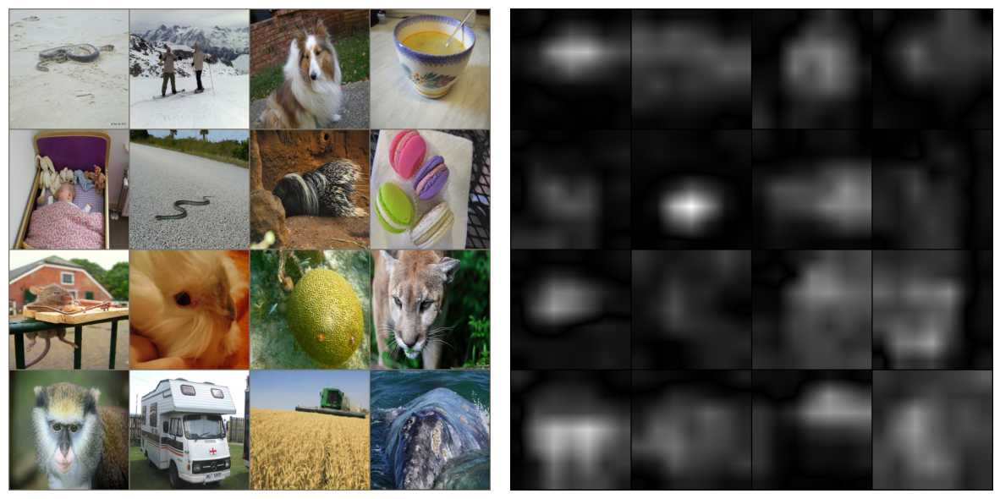

In [39]:
plot_batch_image_attr(images, gradcam)

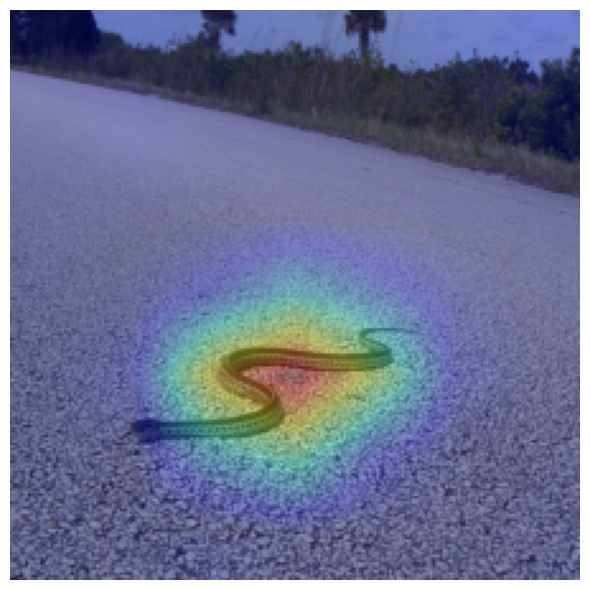

In [40]:
plot_image_attr(images[5][None], gradcam[5][None], overlap = True)

### Interestingly, `captum` does not privde implementation of GradCAM. Instead, it provides an implemention to Guided-GradCAM, which is a variant of GradCAM. 

### GradCAM's implementation can be found in other toolkits such as [`torchray`](https://facebookresearch.github.io/TorchRay/)

In [41]:
# !pip install torchray

In [42]:
from torchray.attribution.grad_cam import grad_cam

def set_relu_inplace_false(model):
    for module in model.modules():
        if isinstance(module, torch.nn.ReLU):
            module.inplace = False
            
set_relu_inplace_false(model)

# Grad-CAM backprop.
attribution = grad_cam(
    model, 
    images.to(device), 
    labels.to(device), 
    saliency_layer='layer4.1.bn1'
).detach().cpu()

upsampler = torch.nn.Upsample(scale_factor = 32, mode = "bilinear")
attribution = upsampler(attribution)

/home/yipei/anaconda3/envs/pytorch/lib/python3.12/site-packages/torchray/attribution/common.py:521: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at aten/src/ATen/core/TensorBody.h:489.)
  if input.grad is not None:


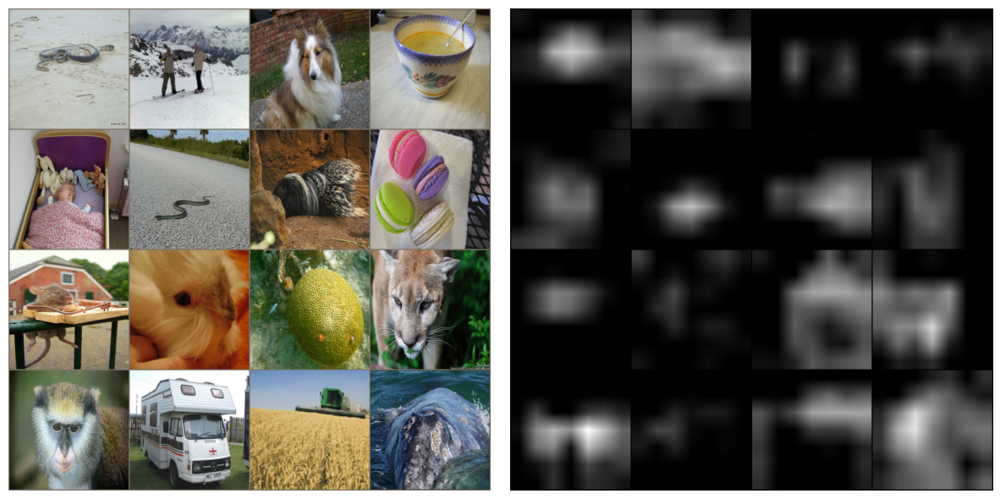

In [43]:
plot_batch_image_attr(images, attribution)

## Smooth Gradient

Ref: [SmoothGrad: removing noise by adding noise](https://arxiv.org/pdf/1706.03825)

As can be observed above, gradient-based explanations tend to be very noise because $\nabla f(\mathbf{x})$ is noisy.

SmoothGrad removes the noise by taking the average over the input gradient explanation of $\mathbf{x}+\epsilon$ where $\epsilon\sim\mathcal{N}(0,\sigma^2)$.

Essentially, it's like looking at the neighbor of the input $\mathbf{x}$ and take the expectation of $\nabla f(\mathbf{x})$.

In [44]:
from attributions import input_gradient
from tqdm import tqdm

M = 100

smoothgrad = []
for i in tqdm(range(M)):
    
    input = images + torch.randn_like(images)*0.5**2
    
    smoothgrad.append(input_gradient(model, input.to(device), labels.to(device)).detach().cpu())
smoothgrad = sum(smoothgrad)/len(smoothgrad)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 28.57it/s]


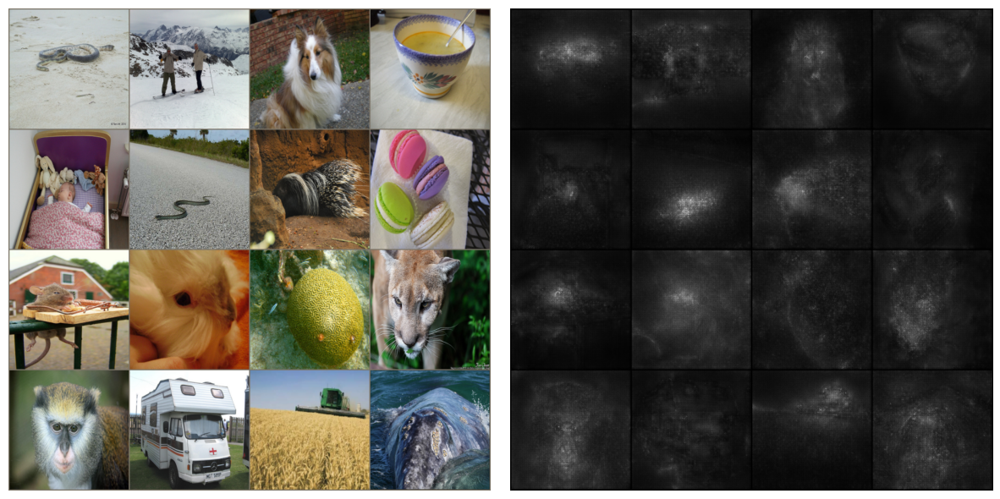

In [45]:
plot_batch_image_attr(images, smoothgrad)
# plot_batch_image_attr(images, grad)

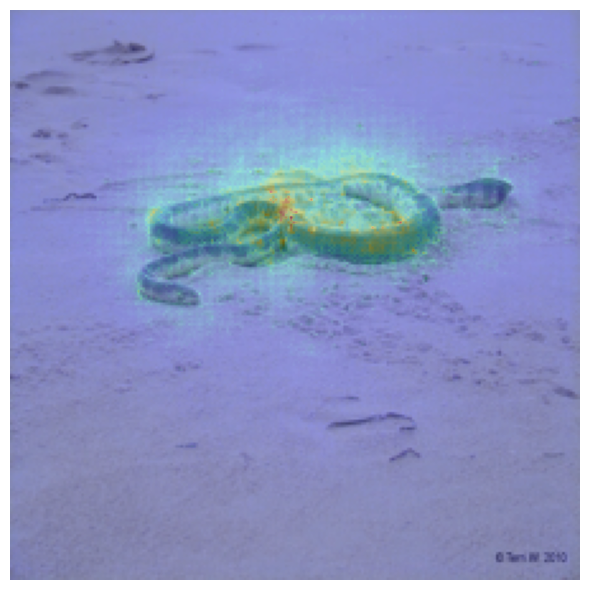

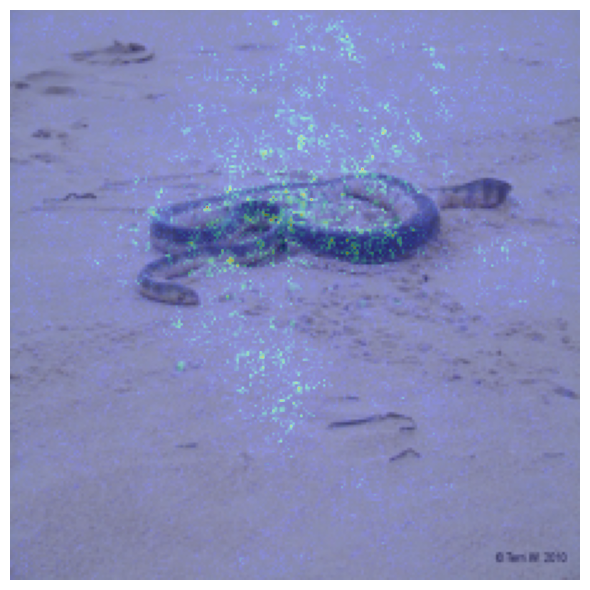

In [46]:
plot_image_attr(images[0][None], smoothgrad[0][None], True)
plot_image_attr(images[0][None], grad[0][None], True)

## Guided Methods --- under controversial

Ref: [STRIVING FOR SIMPLICITY:
THE ALL CONVOLUTIONAL NET](https://arxiv.org/pdf/1412.6806)

Guided-Backpropagation changes the backpropagation rules through the **relu** layers. In the backpropagation process, only **positive gradients** are allowed to pass through.

The implementation of guided-bp is more complicated as it requires to customize a backpropagation function

For controversial, please refer to [this study of sanity check](https://arxiv.org/pdf/1810.03292).

In [47]:
from attributions import GuidedBackprop
            
guided_bp = GuidedBackprop(model)
guidedbp = guided_bp.generate_gradients(images.to(device), labels.to(device)).detach().cpu()

/home/yipei/anaconda3/envs/pytorch/lib/python3.12/site-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


In [48]:
## Captum implementation
from captum.attr import GuidedBackprop

captum_implementation = GuidedBackprop(model)
attribution = captum_implementation.attribute(images.to(device), labels.to(device)).detach().cpu()

/home/yipei/anaconda3/envs/pytorch/lib/python3.12/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:64: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


In [49]:
print((torch.isclose(guidedbp, attribution, atol = 1e-6, rtol = 1e-4)).all())

tensor(False)


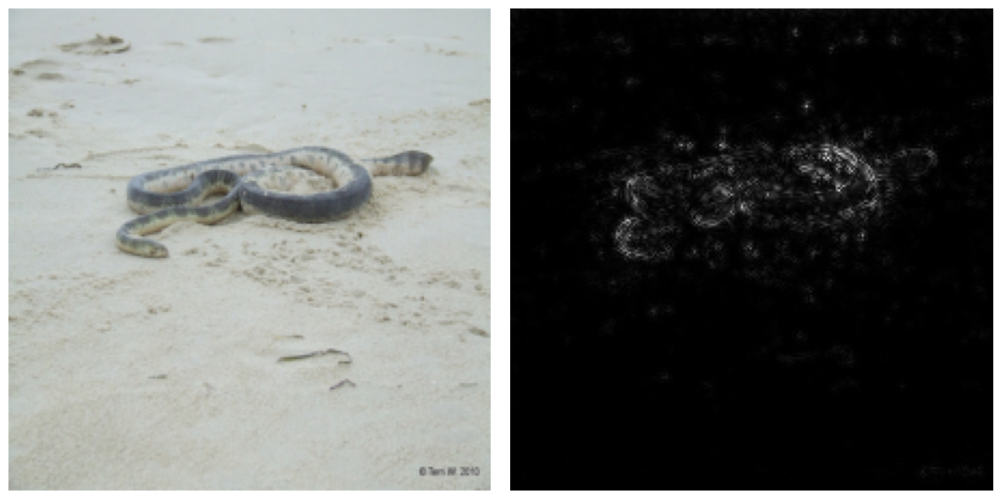

In [50]:
plot_image_attr(images[0][None], guidedbp[0][None])

## Guided GradCAM

This is the variant of GradCAM implementation provided by `captum`. It's basically an element wise product between GradCAM and Guided BP.

In [51]:
from captum.attr import GuidedGradCam

captum_implementation = GuidedGradCam(model, model.layer4)
guidedgradcam = captum_implementation.attribute(images.to(device), labels.to(device)).detach().cpu()

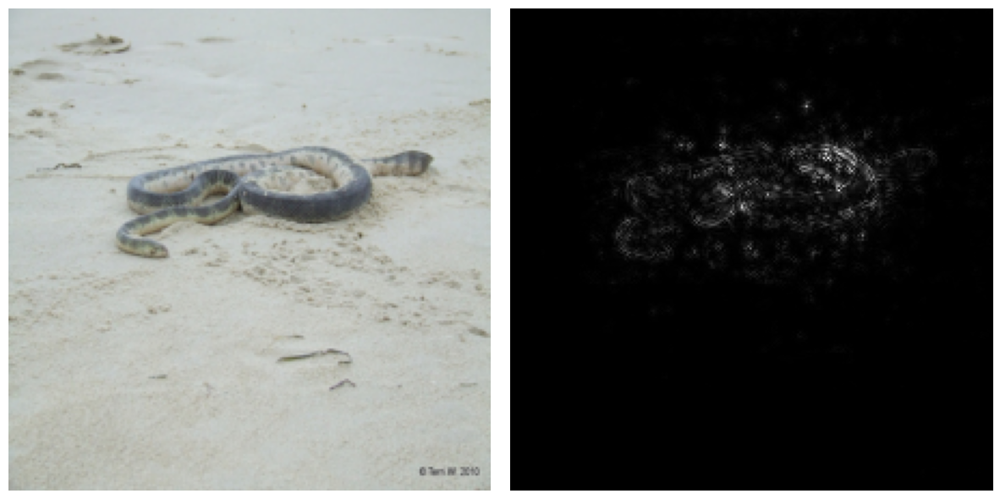

In [52]:
plot_image_attr(images[0][None], guidedgradcam[0][None])

# Target Choices

Ref: [“Why Not Other Classes?”: Towards Class-Contrastive
Back-Propagation Explanations](https://openreview.net/pdf?id=X5eFS09r9hm)

Note that there are in general two types of targets, the predicted logit and likelihood of the corresponding class. This has been a great chaos across the studies, where the targets are either unspecified, or just chosen without any elaborations. 

# Perturbation-Based Explanations

Unlike backpropagation-based explanation methods, perturbation-based methods query the black-box model $f$ with perturbed input samples, and observe how the prediction changes accordingly.

Most generally, such methods use a soft mask $\mathbf{m}\in[0,1]^d$, and studies how 
$$f(\mathbf{x}\odot\mathbf{m} + \mathbf{r}\odot(\mathbf{1} - \mathbf{m}))$$
changes with $\mathbf{m}$.

### Remarks 

- Compared with backpropagation-based methods, purturbation-based methods:
    - Pros: more directly related to specific task; do not require access to the model; more infficient in space; have less requirement to the black-box structures; etc.
    - Cons: less efficient in time; less theoretically guaranteed; etc. 
    
- SHAP is considered as a typical perturbation-based method. 
- LIME is also a perturbation-based methods, but it is questionable as an attribution method.
- SmoothGrad is also an example of the combination of both backpropagation-based methods and perturbation-based methods.

## RISE

Ref: [RISE: Randomized Input Sampling for
Explanation of Black-box Models](https://arxiv.org/pdf/1806.07421v3)

The attribution map is defined by
$$\phi_f(\mathbf{x}) = \frac{1}{\mathbf{E}[M]}\sum_\mathbf{m}f(\mathbf{x}\odot\mathbf{m})P(M = \mathbf{m})\mathbf{m}$$

Which can be seen as a weighted expectation of the masks. The weights are the product of the prediction under this mask and the probability of the mask (empirically set to constant).

In [53]:
from attributions import RISE

# Generate masks for RISE or use the saved ones.
explainer = RISE(model, (224, 224), device, 1)
maskspath = 'masks.npy'
generate_new = True

if generate_new or not os.path.isfile(maskspath):
    explainer.generate_masks(N=1000, s=7, p1=0.1, savepath=maskspath)
else:
    explainer.load_masks(maskspath)
    print('Masks are loaded.')
    
with torch.no_grad():
    attribution = explainer(images[0][None].to(device)).detach().cpu()

Generating filters: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 653.01it/s]


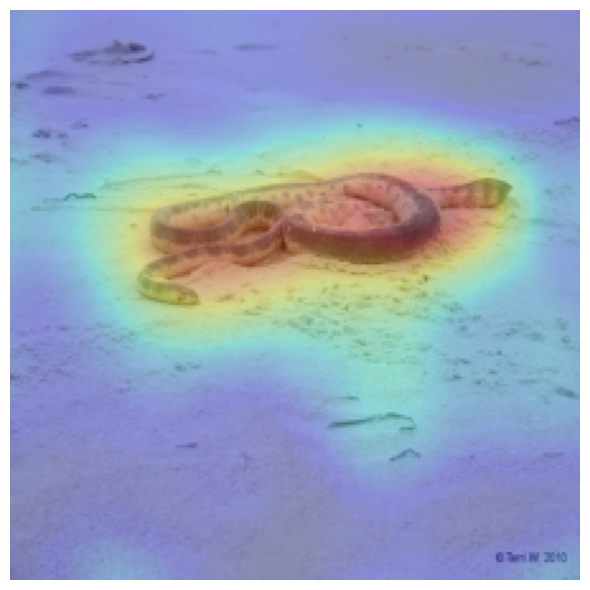

In [54]:
plot_image_attr(images[0][None], attribution[labels[0]][None, None], overlap = True)

## Deletion Metrics

Features are deleted progressively, and the prediction is made after each feature is deleted. Here we give a demo when the features with **smaller** attribution values are deleted first. 

It is thus expected that the prediction should drops **slowly**. That is, the more slowly the better.

In [55]:
edge = 7
downsampler = torch.nn.AdaptiveAvgPool2d(edge)


### Gradient
traj = saliency_to_traj(
    downsampler(abs(grad)[0].mean(0)[None,None]),
    "LeRF")
prob_grad_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_grad_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_grad_diff = prob_grad_le - prob_grad_mo

### IxG
traj = saliency_to_traj(
    downsampler(abs(ixg)[0].mean(0)[None,None]),
    "LeRF")
prob_ixg_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_ixg_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_ixg_diff = prob_ixg_le - prob_ixg_mo

### IG
traj = saliency_to_traj(
    downsampler(abs(ixg)[0].mean(0)[None,None]),
    "LeRF")
prob_ig_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_ig_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_ig_diff = prob_ig_le - prob_ig_mo



### SmoothGrad
traj = saliency_to_traj(
    downsampler(abs(smoothgrad)[0].mean(0)[None,None]),
    "LeRF")
prob_smoothgrad_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_smoothgrad_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_smoothgrad_diff = prob_smoothgrad_le - prob_smoothgrad_mo


### guided gradcam
traj = saliency_to_traj(
    downsampler(abs(guidedgradcam)[0].mean(0)[None,None]),
    "LeRF")
prob_guidedgradcam_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_guidedgradcam_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_guidedgradcam_diff = prob_guidedgradcam_le - prob_guidedgradcam_mo

### gradcam
traj = saliency_to_traj(
    downsampler(abs(gradcam)[0].mean(0)[None,None]),
    "LeRF")
prob_gradcam_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_gradcam_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_gradcam_diff = prob_gradcam_le - prob_gradcam_mo


### guided bp
traj = saliency_to_traj(
    downsampler(abs(guidedbp)[0].mean(0)[None,None]),
    "LeRF")
prob_guidedbp_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_guidedbp_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_guidedbp_diff = prob_guidedbp_le - prob_guidedbp_mo


### RISE
traj = saliency_to_traj(
    downsampler(attribution[labels[0]][None,None]),
    "LeRF")
prob_rise_le, _ = traj_masking(model, images[0].to(device), labels[0], traj, edge = edge)
prob_rise_mo, _ = traj_masking(model, images[0].to(device), labels[0], reversed(traj), edge = edge)
prob_rise_diff = prob_rise_le - prob_rise_mo


Plotting the entire batch


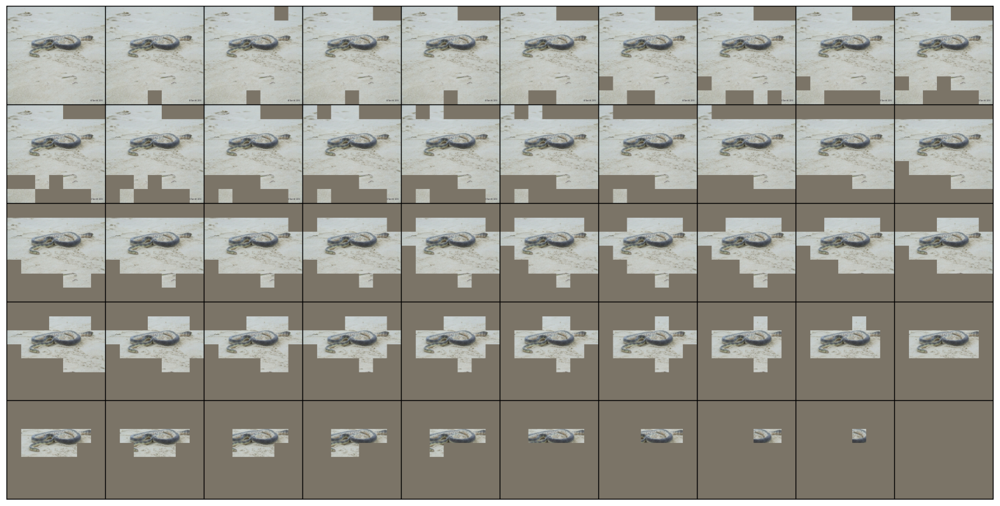

In [56]:
show_traj(images[0][None], traj, edge = edge)

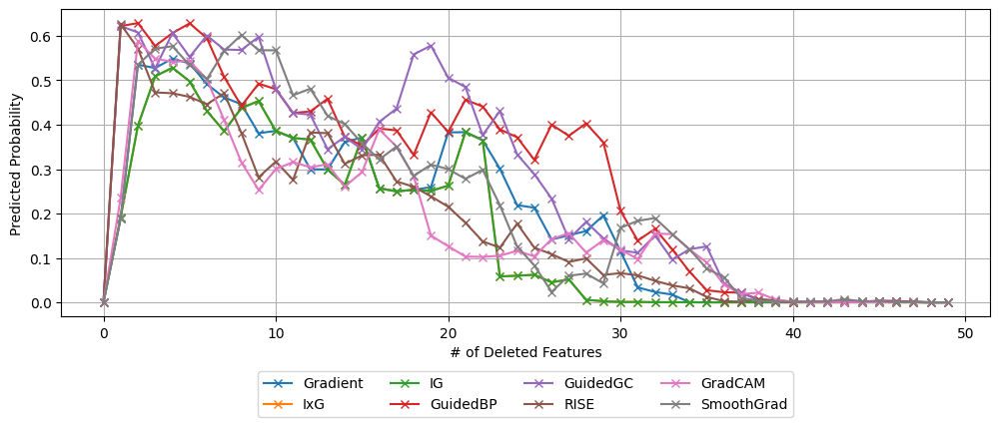

In [57]:
plt.figure(figsize = (12,4))

plt.plot(prob_grad_diff, marker = "x", label = "Gradient")
plt.plot(prob_ixg_diff, marker = "x", label = "IxG")
plt.plot(prob_ig_diff, marker = "x", label = "IG")
plt.plot(prob_guidedbp_diff, marker = "x", label = "GuidedBP")
plt.plot(prob_guidedgradcam_diff, marker = "x", label = "GuidedGC")
plt.plot(prob_rise_diff, marker = "x", label = "RISE")
plt.plot(prob_gradcam_diff, marker = "x", label = "GradCAM")
plt.plot(prob_smoothgrad_diff, marker = "x", label = "SmoothGrad")

plt.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.35), ncol = 4)
plt.ylabel("Predicted Probability")
plt.xlabel("# of Deleted Features")
plt.grid()
plt.show()

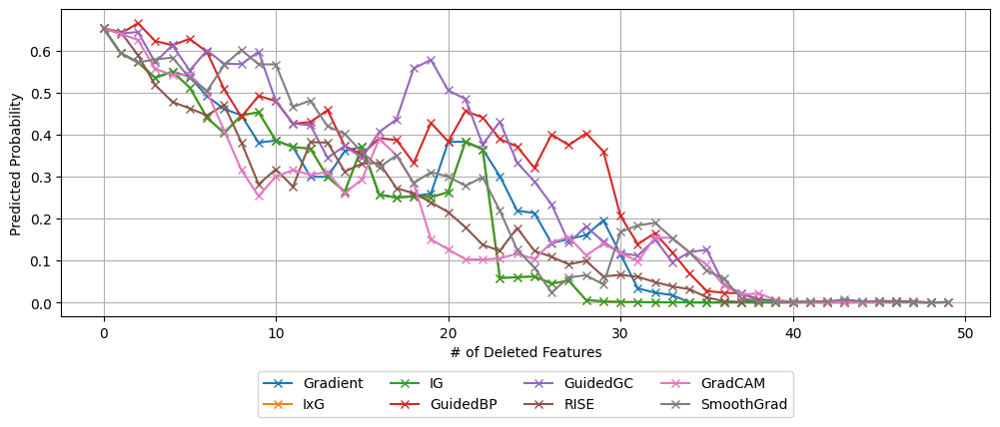

In [58]:
plt.figure(figsize = (12,4))

plt.plot(prob_grad_le, marker = "x", label = "Gradient")
plt.plot(prob_ixg_le, marker = "x", label = "IxG")
plt.plot(prob_ig_le, marker = "x", label = "IG")
plt.plot(prob_guidedbp_le, marker = "x", label = "GuidedBP")
plt.plot(prob_guidedgradcam_le, marker = "x", label = "GuidedGC")
plt.plot(prob_rise_le, marker = "x", label = "RISE")
plt.plot(prob_gradcam_le, marker = "x", label = "GradCAM")
plt.plot(prob_smoothgrad_le, marker = "x", label = "SmoothGrad")

plt.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.35), ncol = 4)
plt.ylabel("Predicted Probability")
plt.xlabel("# of Deleted Features")
plt.grid()
plt.show()

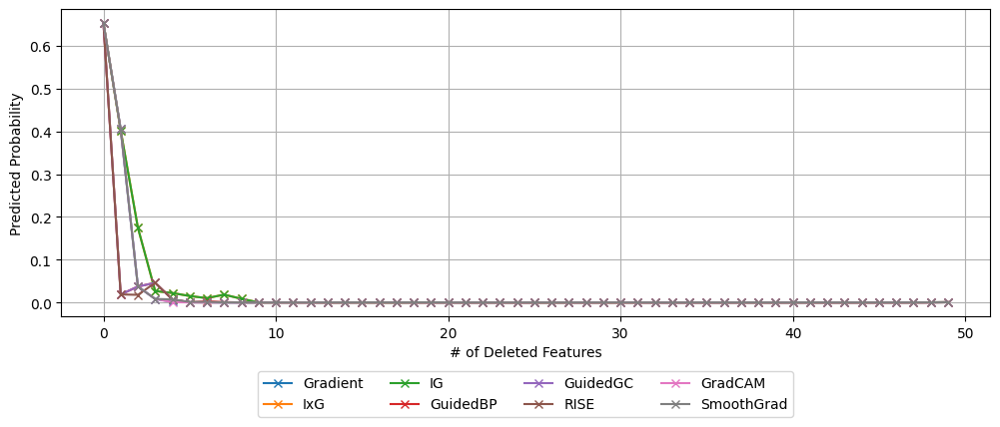

In [59]:
plt.figure(figsize = (12,4))

plt.plot(prob_grad_mo, marker = "x", label = "Gradient")
plt.plot(prob_ixg_mo, marker = "x", label = "IxG")
plt.plot(prob_ig_mo, marker = "x", label = "IG")
plt.plot(prob_guidedbp_mo, marker = "x", label = "GuidedBP")
plt.plot(prob_guidedgradcam_mo, marker = "x", label = "GuidedGC")
plt.plot(prob_rise_mo, marker = "x", label = "RISE")
plt.plot(prob_gradcam_mo, marker = "x", label = "GradCAM")
plt.plot(prob_smoothgrad_mo, marker = "x", label = "SmoothGrad")

plt.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.35), ncol = 4)
plt.ylabel("Predicted Probability")
plt.xlabel("# of Deleted Features")
plt.grid()
plt.show()

## TRACE

Ref: [Benchmarking Deletion Metrics with the Principled Explanations](https://openreview.net/pdf?id=SKPhvzxO1g)

This method optimizes the deletion metrics directly by combinatorial optimizations.

In [60]:
from attributions import simulated_annealing
import itertools
candidates = list(itertools.combinations(range(edge**2), 2))
traj = simulated_annealing( 
    model,
    images[0].to(device), 
    labels[0], 
    candidates,
    reference = "zero",
    mode = "LeRF-MoRF",
    edge = edge,
    T = 0.05, 
    eta = 0.998, 
    threshold = 0., 
    verbose = True,
    n_iteration = 1000,
    random_init = False
)    



start:  -21.268282
t: 4, score: -21.7452, T: 0.0497 kendall onestep: 1.0000, kendall overall: 1.0000
t: 18, score: -21.6358/-21.7452, T: 0.0483 kendall onestep: 15.0000, kendall overall: 8.0000
t: 19, score: -21.6446/-21.7452, T: 0.0482 kendall onestep: 9.0000, kendall overall: 11.0000
t: 81, score: -21.6326/-21.7452, T: 0.0426 kendall onestep: 1.0000, kendall overall: 12.0000
t: 94, score: -21.6308/-21.7452, T: 0.0415 kendall onestep: 5.0000, kendall overall: 13.0000
t: 103, score: -21.6471/-21.7452, T: 0.0408 kendall onestep: 9.0000, kendall overall: 16.0000
t: 112, score: -21.6909/-21.7452, T: 0.0400 kendall onestep: 27.0000, kendall overall: 15.0000
t: 151, score: -21.7068/-21.7452, T: 0.0370 kendall onestep: 13.0000, kendall overall: 14.0000
t: 198, score: -21.6349/-21.7452, T: 0.0337 kendall onestep: 67.0000, kendall overall: 17.0000
t: 207, score: -21.6237/-21.7452, T: 0.0331 kendall onestep: 1.0000, kendall overall: 18.0000
t: 239, score: -21.6653/-21.7452, T: 0.0310 kendall on

In [61]:
prob_trace_le = traj_masking(model, images[0].to(device), labels[0].to(device), traj, reference = "zero", edge = edge)[0]
prob_trace_mo = traj_masking(model, images[0].to(device), labels[0].to(device), reversed(traj), reference = "zero", edge = edge)[0]
prob_trace_diff = prob_trace_le - prob_trace_mo

Plotting the entire batch


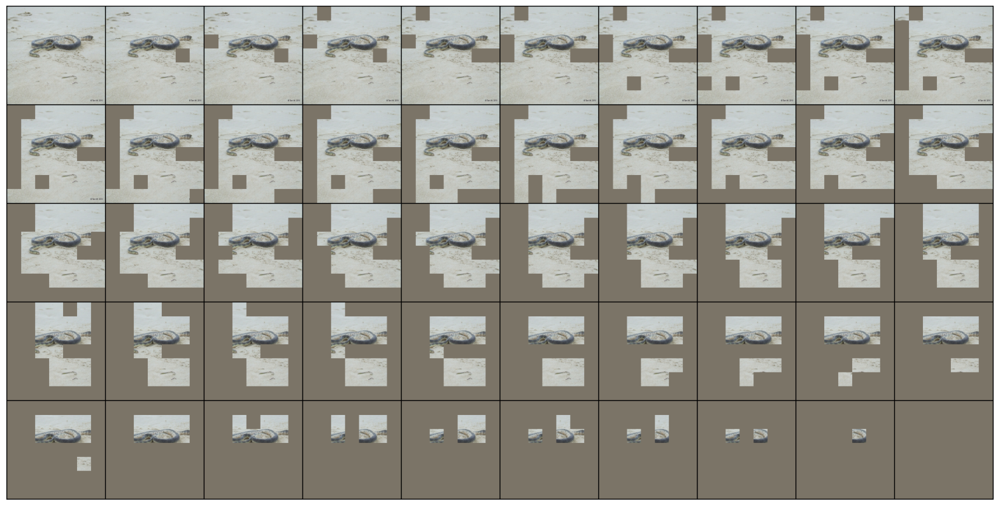

In [62]:
show_traj(images[0][None], traj, edge = edge)

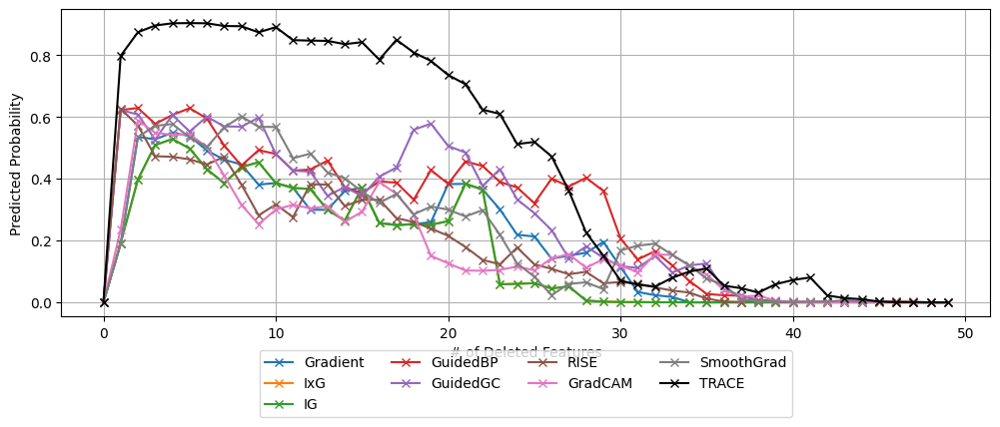

In [63]:
plt.figure(figsize = (12,4))

plt.plot(prob_grad_diff, marker = "x", label = "Gradient")
plt.plot(prob_ixg_diff, marker = "x", label = "IxG")
plt.plot(prob_ig_diff, marker = "x", label = "IG")
plt.plot(prob_guidedbp_diff, marker = "x", label = "GuidedBP")
plt.plot(prob_guidedgradcam_diff, marker = "x", label = "GuidedGC")
plt.plot(prob_rise_diff, marker = "x", label = "RISE")
plt.plot(prob_gradcam_diff, marker = "x", label = "GradCAM")
plt.plot(prob_smoothgrad_diff, marker = "x", label = "SmoothGrad")
plt.plot(prob_trace_diff, color = "k", marker = "x", label = "TRACE")

plt.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.35), ncol = 4)
plt.ylabel("Predicted Probability")
plt.xlabel("# of Deleted Features")
plt.grid()
plt.show()

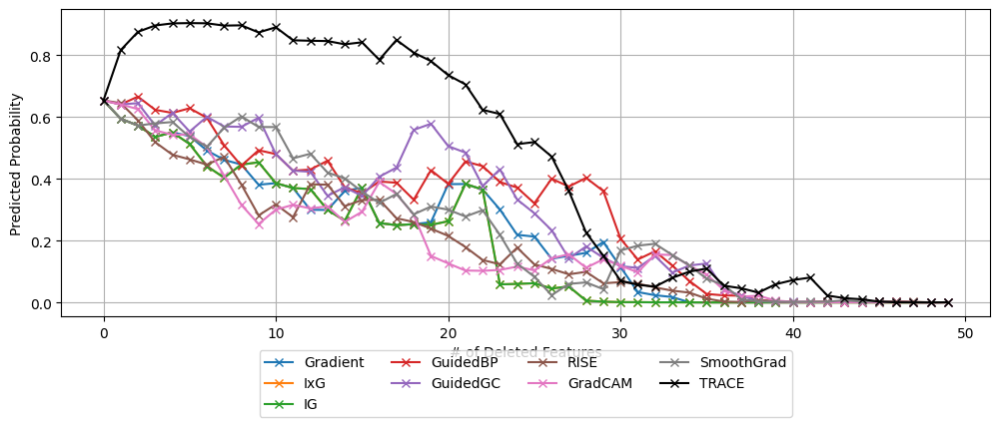

In [64]:
plt.figure(figsize = (12,4))

plt.plot(prob_grad_le, marker = "x", label = "Gradient")
plt.plot(prob_ixg_le, marker = "x", label = "IxG")
plt.plot(prob_ig_le, marker = "x", label = "IG")
plt.plot(prob_guidedbp_le, marker = "x", label = "GuidedBP")
plt.plot(prob_guidedgradcam_le, marker = "x", label = "GuidedGC")
plt.plot(prob_rise_le, marker = "x", label = "RISE")
plt.plot(prob_gradcam_le, marker = "x", label = "GradCAM")
plt.plot(prob_smoothgrad_le, marker = "x", label = "SmoothGrad")
plt.plot(prob_trace_le, color = "k", marker = "x", label = "TRACE")

plt.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.35), ncol = 4)
plt.ylabel("Predicted Probability")
plt.xlabel("# of Deleted Features")
plt.grid()
plt.show()

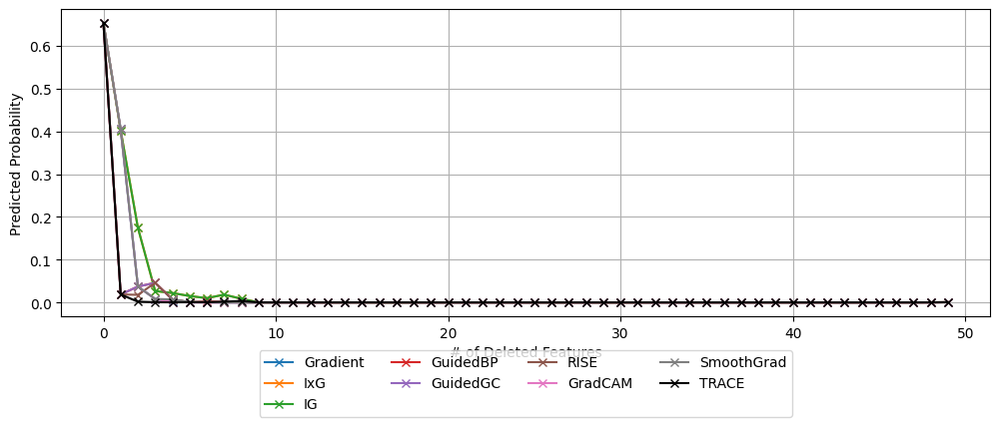

In [65]:
plt.figure(figsize = (12,4))

plt.plot(prob_grad_mo, marker = "x", label = "Gradient")
plt.plot(prob_ixg_mo, marker = "x", label = "IxG")
plt.plot(prob_ig_mo, marker = "x", label = "IG")
plt.plot(prob_guidedbp_mo, marker = "x", label = "GuidedBP")
plt.plot(prob_guidedgradcam_mo, marker = "x", label = "GuidedGC")
plt.plot(prob_rise_mo, marker = "x", label = "RISE")
plt.plot(prob_gradcam_mo, marker = "x", label = "GradCAM")
plt.plot(prob_smoothgrad_mo, marker = "x", label = "SmoothGrad")
plt.plot(prob_trace_mo, color = "k", marker = "x", label = "TRACE")

plt.legend(loc = "lower center", bbox_to_anchor = (0.5, -0.35), ncol = 4)
plt.ylabel("Predicted Probability")
plt.xlabel("# of Deleted Features")
plt.grid()
plt.show()

In [66]:
trace = upsampler(
    torch.FloatTensor((traj.argsort()/edge**2)**2).view(1,1,edge,edge))

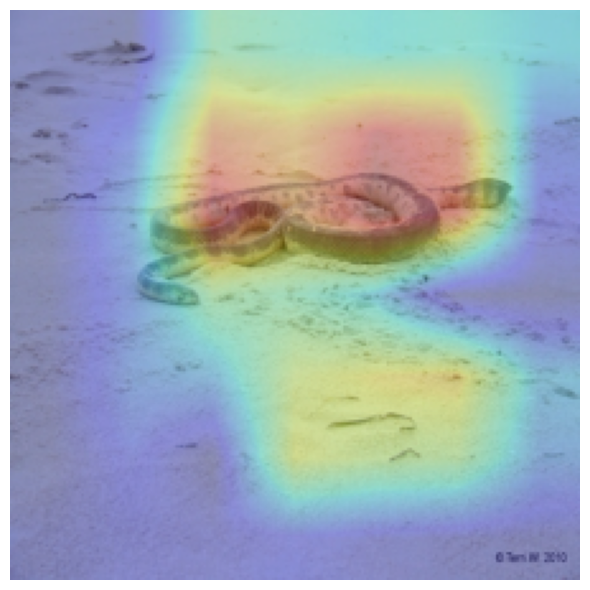

In [67]:
plot_image_attr(images[0][None], trace, True)